In [ ]:
import cv2, pyautogui, glob, random, statistics, PIL.Image 
import numpy as np
import matplotlib.pyplot as plt
from astropy.visualization import SqrtStretch# Un bout de racine carrée
from astropy.visualization.mpl_normalize import ImageNormalize# Classe de normalisation pour adapter à l'utilisation avec Matplotlib.
from photutils import detect_threshold, detect_sources
from astropy.convolution import Gaussian2DKernel
from astropy.stats import gaussian_fwhm_to_sigma
from photutils import source_properties, EllipticalAperture
import matplotlib as mpl
from math import sqrt
from tifffile import imread
import time
t1=time.time()
print("Librairies OK")
path = glob.glob('tif/*.tif')
N = len(path); Images = []# tableau vide pour charger les images 
for i in range(N):# parcourir le nombre des images
    I_Base = imread(path[i])
    #I_Base = np.asanyarray(I_Base, np.uint8)
    Images.append(I_Base)
t2=time.time()
print("Data OK dans ", t2-t1,"secondes")
print("Data pictures OK",plt.imshow(Images[100]),plt.show());

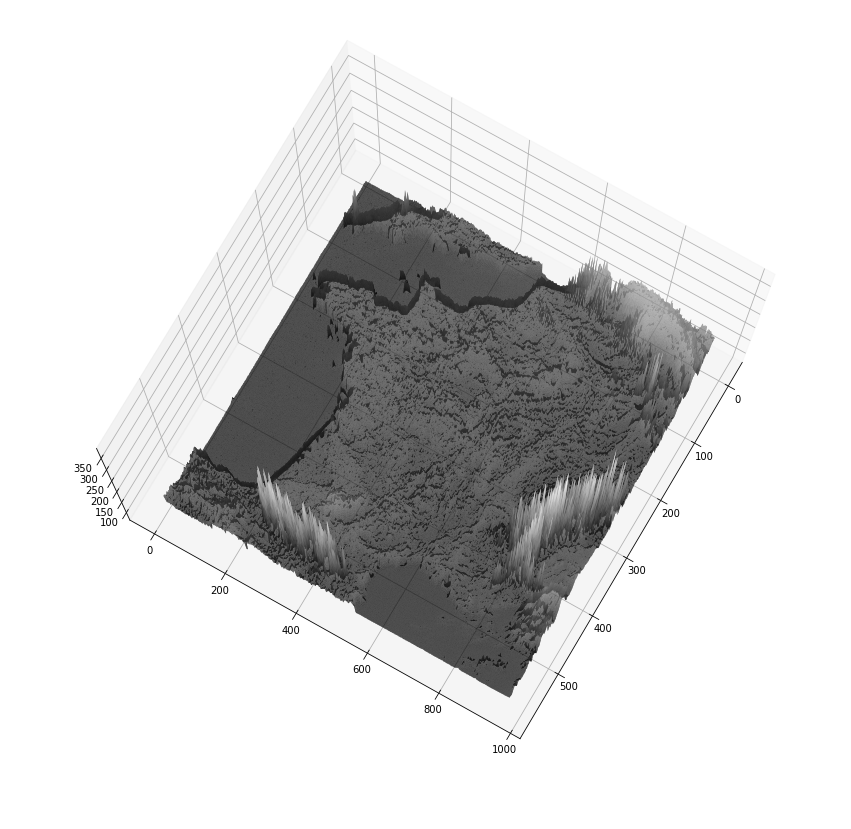

In [13]:
xx, yy = np.mgrid[0:Images[10].shape[0], 0:Images[10].shape[1]]
fig = plt.figure(figsize=(15,15))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, Images[10] ,rstride=1, cstride=1, cmap=plt.cm.gray,linewidth=2)
ax.view_init(80, 30)
plt.show()

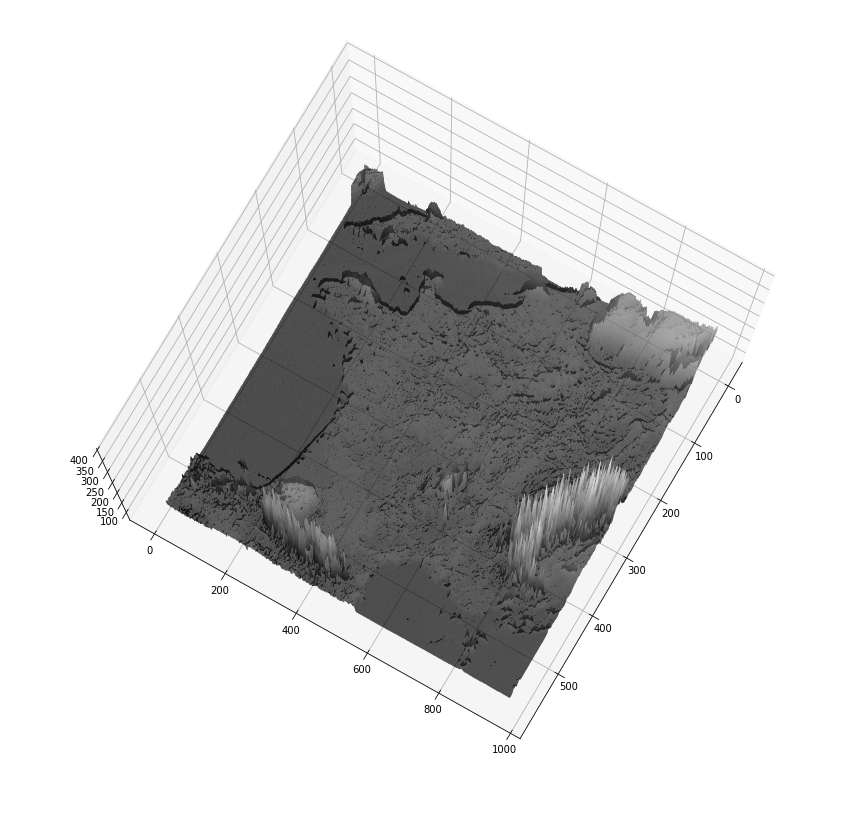

In [11]:

xx, yy = np.mgrid[0:Images[100].shape[0], 0:Images[100].shape[1]]
fig = plt.figure(figsize=(15,15))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, Images[100] ,rstride=1, cstride=1, cmap=plt.cm.gray,linewidth=2)
ax.view_init(80, 30)
plt.show()


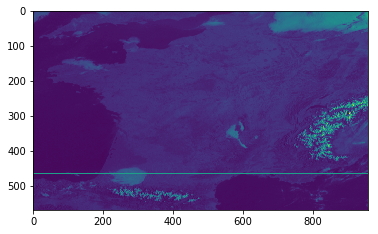

(<matplotlib.image.AxesImage at 0x7f7f43c21b38>, None)

In [17]:
I = np.array(Images[100])
I[465,:] = 255
plt.imshow(I),plt.show()

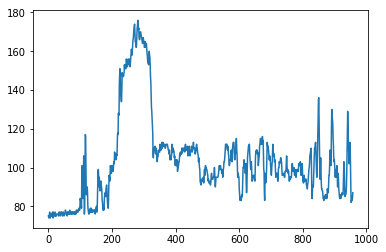

In [18]:
plt.plot(Images[100][465,:]);
plt.show()

In [19]:
#segm = detect_sources(data, seuil, npixels=10, filter_kernel=kernel)

# La fonctuion detect_sources permet de détecter les sources supérieures à une valeur de seuil
# spécifiée dans une image et de renvoyer un objet d'image de segmentation.
# Les sources détectées doivent avoir un nombre de pixels connectés supérieur à la valeur seuil.
# Si l'option de filtrage est utilisée, le seuil est appliqué à l'image filtrée. 
# Le masque de saisie peut être utilisé pour masquer des pixels dans les données d'entrée. 
# Les pixels masqués ne seront inclus dans aucune source.
# Cette fonction ne supprime pas les sources qui se chevauchent.
#------------------------------
# La fonction source_properties permet de Calculer les propriétés photométriques
# et morphologiques des sources définies par une image de segmentation étiquetée.

In [26]:
def seg(img, SNR, S, w):
    data = img
    seuil = detect_threshold(data, snr= SNR)# Seuillage 
    sigma = S * gaussian_fwhm_to_sigma
    kernel = Gaussian2DKernel(sigma, x_size=w, y_size=w).normalize()# definition de noyau gaussian 
    segm = detect_sources(data, seuil, npixels=4, filter_kernel=kernel)
    cat = source_properties(data, segm); r = 2.5; Ellipses_Nuages = []
    plt.imshow(segm, cmap=segm.cmap()),plt.title(np.count_nonzero(cat))
    plt.axis('off'),plt.gcf().set_size_inches(1.2*plt.gcf().get_size_inches());

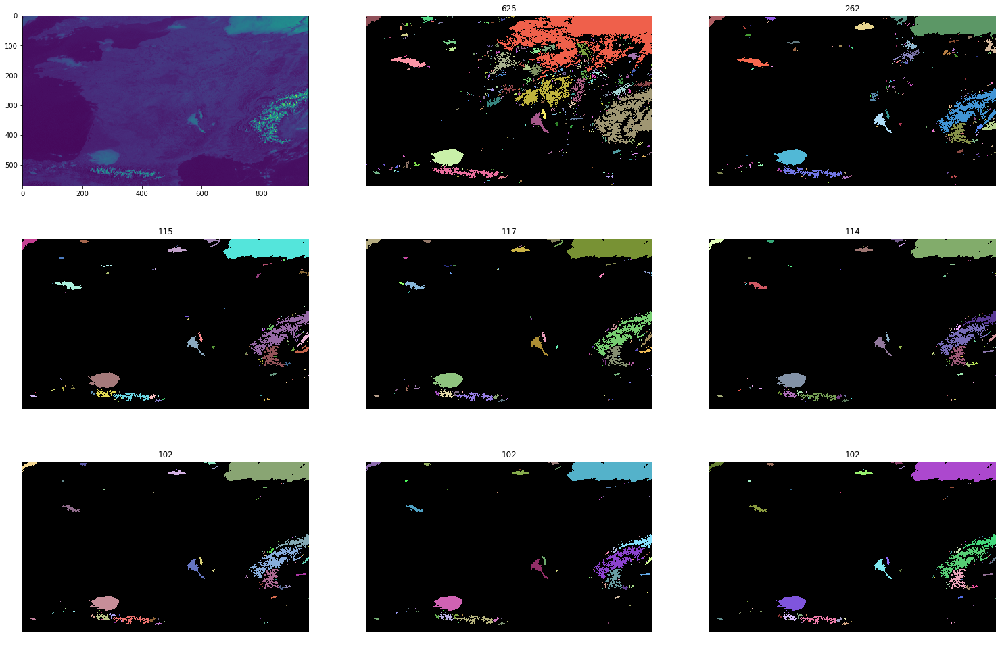

In [27]:
# choix de la zone du noyau de gaussian 
plt.subplot(3,3,1);plt.imshow(Images[100])
plt.subplot(3,3,2);seg(Images[100], SNR = 1.02, S = 3., w=1)
plt.subplot(3,3,3);seg(Images[100], SNR = 1.50, S = 3., w=5)
plt.subplot(3,3,4);seg(Images[100], SNR = 1.90, S = 3., w=10)
plt.subplot(3,3,5);seg(Images[100], SNR = 2.00, S = 3., w=25)
plt.subplot(3,3,6);seg(Images[100], SNR = 2.30, S = 3., w=40)
plt.subplot(3,3,7);seg(Images[100], SNR = 2.50, S = 3., w=50)
plt.subplot(3,3,8);seg(Images[100], SNR = 2.50, S = 3., w=75)
plt.subplot(3,3,9);seg(Images[100], SNR = 2.50, S = 3., w=90)
# RQ: plus que la zone de noyau gaussian est petit , plus qu'il y a des aparition 
#des points isoleés qui correspond pas forcement aux nuages 
# La zone de nayau gaussian influt sur les zones des nuages segmentées
# plus que w est petit , plus que le nombre des nuages segmentées est important,
#a partir de w =50 , le nombre de nuages segmentées est fixé a 50 
# alors le nombre des nuages egales a 112

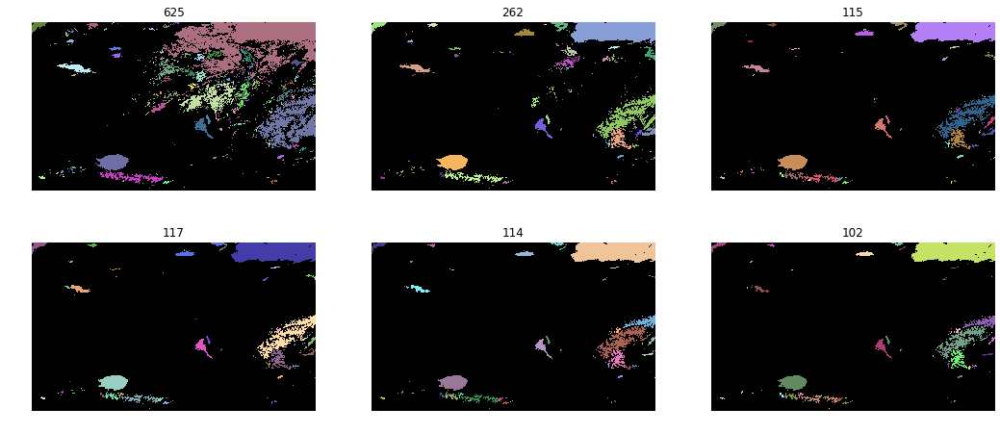

In [28]:
plt.subplot(3,3,1);seg(Images[100], SNR = 1.02, S = 3., w=50),
plt.subplot(3,3,2);seg(Images[100], SNR = 1.50, S = 3., w=50)
plt.subplot(3,3,3);seg(Images[100], SNR = 1.90, S = 3., w=50)
plt.subplot(3,3,4);seg(Images[100], SNR = 2.00, S = 3., w=50)
plt.subplot(3,3,5);seg(Images[100], SNR = 2.30, S = 3., w=50)
plt.subplot(3,3,6);seg(Images[100], SNR = 2.50, S = 3., w=50)
# Donc pour SNR la meilleur valeur est egale a 2.5

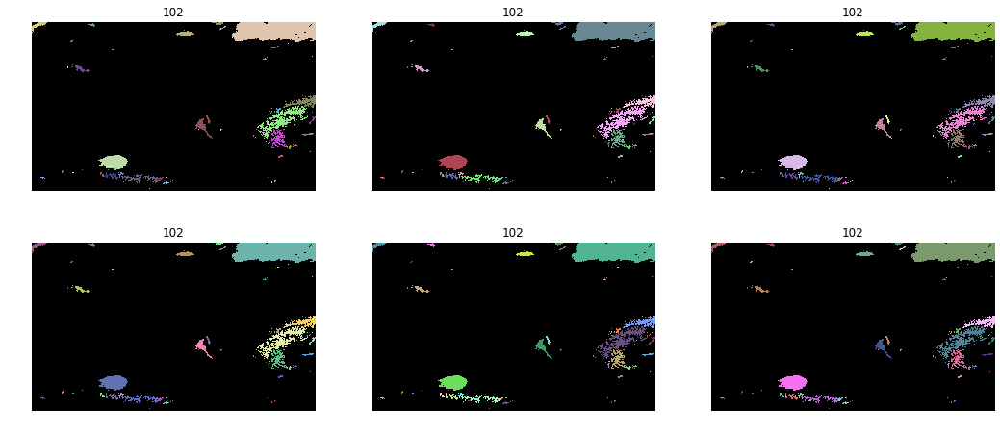

In [29]:
# Choix de bon valeur pour sigma
plt.subplot(3,3,1);seg(Images[100], SNR = 2.50, S = 0.50, w=50)
plt.subplot(3,3,2);seg(Images[100], SNR = 2.50, S = 0.70, w=50)
plt.subplot(3,3,3);seg(Images[100], SNR = 2.50, S = 1.80, w=50)
plt.subplot(3,3,4);seg(Images[100], SNR = 2.50, S = 3.50, w=50)
plt.subplot(3,3,5);seg(Images[100], SNR = 2.50, S = 6.00, w=50)
plt.subplot(3,3,6);seg(Images[100], SNR = 2.50, S = 10.00, w=50)
#-

In [2]:
def Sqr(a): 
    return a*a 
def Distance(x1,y1,x2,y2): 
    return sqrt(Sqr(y2-y1)+Sqr(x2-x1))
def Zoom(m):
    return plt.axis('off'),plt.gcf().set_size_inches(m*plt.gcf().get_size_inches());

(<matplotlib.image.AxesImage at 0x7f8cf338dc50>,
 ((-0.5, 702.5, 541.5, -0.5), None))

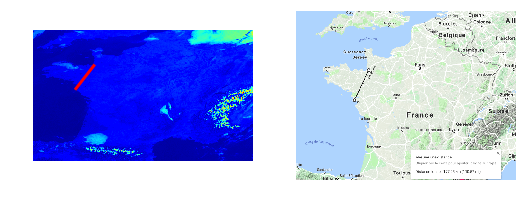

In [3]:
plt.subplot(1,2,1)
plt.imshow(Images[100],cmap = 'jet'),Zoom(1.2)
x1 = 187;x2 = 265;
y1 = 255;y2 = 155;
plt.plot([x1, x2],[y1, y2],lw=3.01, color = 'r')#xx,yy
plt.subplot(1,2,2)
Im_googleMap = plt.imread('Distance2.png')
plt.imshow(Im_googleMap),Zoom(1.2)

In [4]:
#Echelle
distance_reel = 177.95 # en KM
distance_Image = Distance(x1,y1,x2,y2)#en pixel
distance_Image # =126.82271089990152
Echelle = distance_reel/distance_Image # KM / Pixel
Echelle

1.4031398535586592

In [6]:
def cmap_seg( SEG ):# foction qui calcul une carte de couleur de segmentation donné
    NOBJmax = np.count_nonzero(SEG.labels)# nombre d'objets issues de segmentation 
    colors= np.zeros((NOBJmax,3))# definition du tableau de couleur, de dimension (nombre d'objets a segmenter et 3 couleurs)
    for i in range(1, NOBJmax,1):
        c = round((SEG[i].label/NOBJmax),1)# niveau de couleur entre 0 et 1
        colors[i,:]= [c,c,c];# remplir le tableau des couleurs
    cm = mpl.colors.ListedColormap(colors)# creation de la carte des couleurs
    return cm

def Calc_Ellipses(CAT):# calcul des ellipses autour des nuages
    r = 2.68;# rayon autou de contour de l'objet
    Ellipses_Nuages = []# tableau a remplir avec les point qui nous permet de tracer une ellipse
    for obj in CAT: # parcourir la liste des objets dans la segmentation
        # extraction de la position de centroide a partir de l'objet
        position = (obj.xcentroid.value, obj.ycentroid.value) 
        a = obj.semimajor_axis_sigma.value * r # parametres de l'lipsiode 
        b = obj.semiminor_axis_sigma.value * r 
        #la fonction  EllipticalAperture permet de  calculer et retourne les points de tracage d'une ellipsoide 
        Ellipses_Nuages.append(EllipticalAperture(position, a, b, theta=obj.orientation.value))
    return Ellipses_Nuages

# Relabelisation de segmentation de l'image 2 avec celle de l'image 1
def Change_Labels(SEG_2, CAT_1, CAT_2):# fonction qui change les labels pour une segmentation donné
    dists = []
    for i in range(np.count_nonzero(CAT_2)):# parcours nombre des objets segmenté a partir de l'image 2 
        #coordonnes x et y d'un objet segmenté a partir de l'image 2  
        x1 = np.uint64(CAT_2[i].centroid[0]);
        y1 = np.uint64(CAT_2[i].centroid[1]);
        for j in range(np.count_nonzero(CAT_1)):# parcourir le nombre des objets segmentées dans l'images 1
            #coordonnes x et y d'un objet segmenté a partir de l'image 2
            x2 = np.uint64(CAT_1[j].centroid[0]); y2 = np.uint64(CAT_1[j].centroid[1]);
            # calcul de la distance entre le controide d'un objet de l'image 2 et les autres de l'image 1
            d = Distance(x1,y1,x2,y2)
            dists.append(d)# charger les resultats dans un tableau
        for jj in range(np.count_nonzero(CAT_1)):# parcourir le nombre des objets de segmentation de l'image 1
            # si la distance entre un objet segmenté de l'image 2 et un objet sgmenté de l'image 1 egale
            # a la distance minimale pamis les distances entre un objet segmenté de l'image2 et toutes 
            # les objets de la segmentation de l'image 1 
            # et si la distance n'est pas nulle
            if (min(dists) == dists[jj]  and dists[jj]!=0): 
                SEG_2[jj].label = jj;#si condition correcte , labeliser l'objet dans la segmentation de l'image 2 
                # avec le nom du label de l'onjet dans l'image precedant.
    return SEG_2

def Vitesse_Nuage(CAT_1, CAT_2):# fonction qui calcul le vitesse d'une nuage
    # calcul de la distance avec la meme methode de la fonction de labelisation 
    dists = []; Vitesses = np.zeros(np.count_nonzero(CAT_2));
    for i in range(np.count_nonzero(CAT_2)):
        x1 = np.uint64(CAT_2[i].centroid[0]); y1 = np.uint64(CAT_2[i].centroid[1]);
        for j in range(np.count_nonzero(CAT_1)):
            x2 = np.uint64(CAT_1[j].centroid[0]); y2 = np.uint64(CAT_1[j].centroid[1]);
            d = Distance(x1,y1,x2,y2) # calcul de distance
            dists.append(d)
        for jj in range(np.count_nonzero(CAT_2)):
            if (min(dists) == dists[jj] and dists[i]!=0):
                Vitesses[i] = (dists[jj]*1.4031398535586592)/(5/60)# calcul de la vitesse pour 
                #chaque nuage de l'image 2 
    return Vitesses# Vitesse relative en Km/h


def seg_Nuages(BD, Min, Max):
    SNR = 2.5; sigma = 10;
    # initialisation de la noyau gaussian avec sigma et dimension et seuil
    kernel = Gaussian2DKernel(sigma, x_size=100, y_size=100).normalize()# definition de noyau gaussian 
    segm = [];cat = []; Nb_cat = 0
    for i in range(Min, Max, 1):
        data = BD[i]
        if i == Min:
            seuil = detect_threshold(data, snr= SNR)# Seuillage pour image en cours    
            S = detect_sources(data, seuil, npixels=50, filter_kernel=kernel)
            segm.extend([S])
            CAT = source_properties(data, S)
            cat.extend([CAT]);
            nbobj = np.count_nonzero(CAT)
            Ellipses_Nuages1 = Calc_Ellipses(CAT = CAT) # Calcul des ellipses autour des nuages
            coul_1 = cmap_seg(SEG = S)# couleur de map de  segmentation n° 1
            norm = ImageNormalize(stretch=SqrtStretch())
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 12.5))
            ax1.imshow(data,'Greys_r', norm=norm),Zoom(1.4);
            ax2.imshow(S, cmap = coul_1 ),Zoom(1.4);
            for Ellipse in Ellipses_Nuages1:
                Ellipse.plot(color='red', lw=1.4, ax=ax1)
                Ellipse.plot(color='#ffee00', lw=1.4, ax=ax2)       
            Nb_cat = 0
        else:
            Nb_cat = Nb_cat + 1
            seuil = detect_threshold(data, snr= SNR);# Seuillage
            segm2 = detect_sources(data, seuil, npixels=38, filter_kernel=kernel)
            Cat_obj2 = source_properties(data, segm2);
            cat.extend([Cat_obj2]); r = 2.5; 
            #Relabelisation de segmentation de l'image2
            R_S = Change_Labels(SEG_2 = segm2, CAT_1 = cat[Nb_cat-1], CAT_2 = Cat_obj2)
            segm.extend([R_S])
            Ellipses_Nuages2 = Calc_Ellipses(CAT = cat[Nb_cat])#Pour le tracage de l'ellipse autour du nuage
            coul_1 = cmap_seg(SEG = segm[Nb_cat])# creation de carte couleurs a partir de la segmentation N°2
            V = Vitesse_Nuage(CAT_1 = cat[Nb_cat-1], CAT_2 = Cat_obj2);
            norm = ImageNormalize(stretch=SqrtStretch());
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 12.5));
            ax1.imshow(data,'Greys_r', norm=norm),Zoom(1.4);
            ax2.imshow(segm[Nb_cat], cmap = coul_1),Zoom(1.4);
            for Ellipse in Ellipses_Nuages2:
                Ellipse.plot(color='r', lw=1.4,  ax=ax1);
                Ellipse.plot(color='#ffee00', lw=1.4, ax=ax2);
                for i in range(len(Cat_obj2)):
                    X = Cat_obj2[i].xcentroid.value;
                    Y  = Cat_obj2[i].ycentroid.value;
                    ax1.text(x = X, y = Y, s = round(V[i],3), color='b');
                    ax2.text(x = X, y = Y, s = round(V[i],3), color='#ffee00');

/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after re

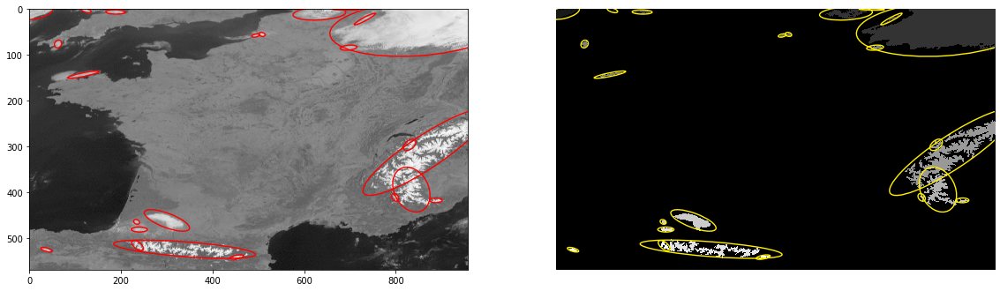

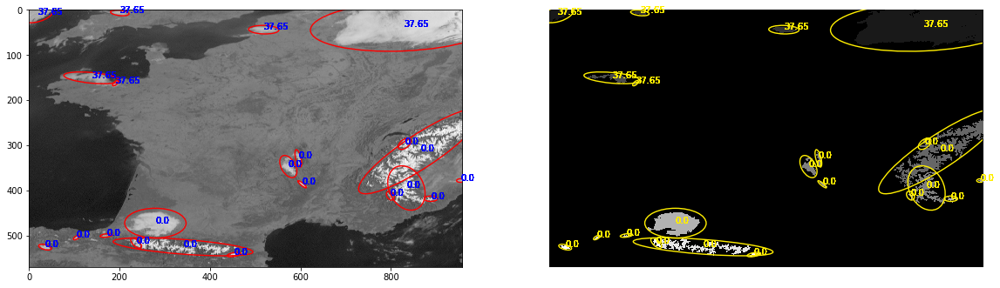

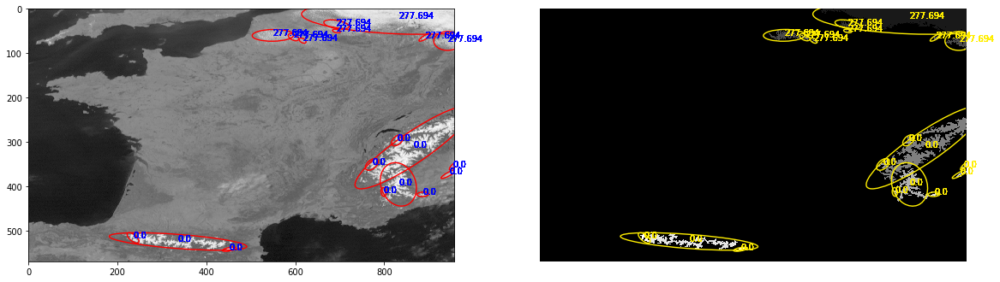

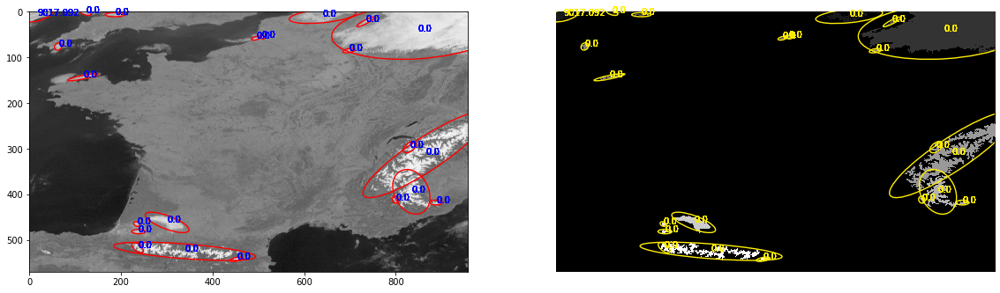

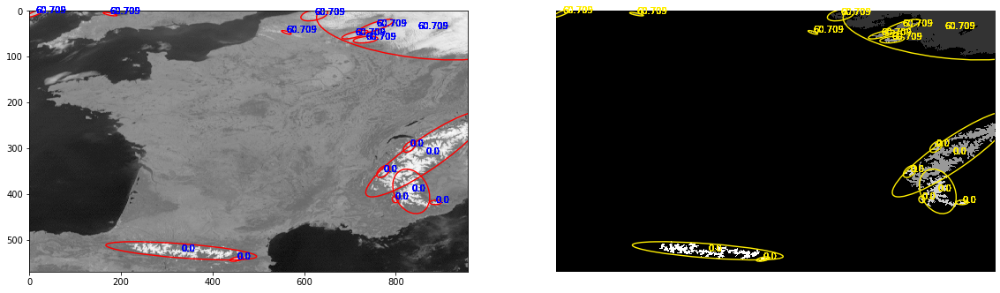

In [8]:
seg_Nuages(BD=Images, Min=125, Max=130)

/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after re

/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/mat

/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in ulong_scalars
  after removing the cwd from sys.path.
/home/ls/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in ulong_scalars
  
/home/ls/.local/lib/python3.6/site-packages/mat

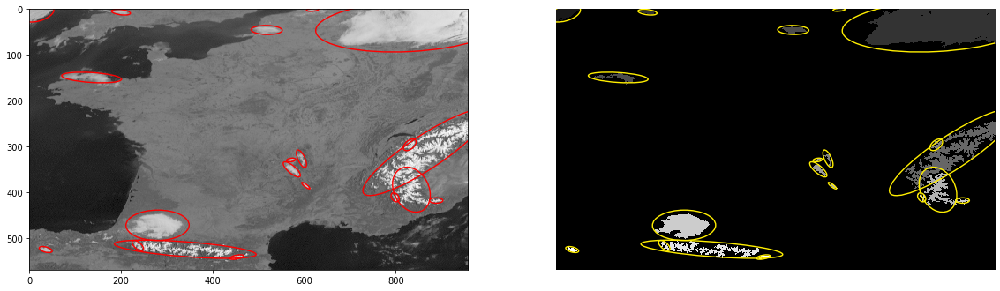

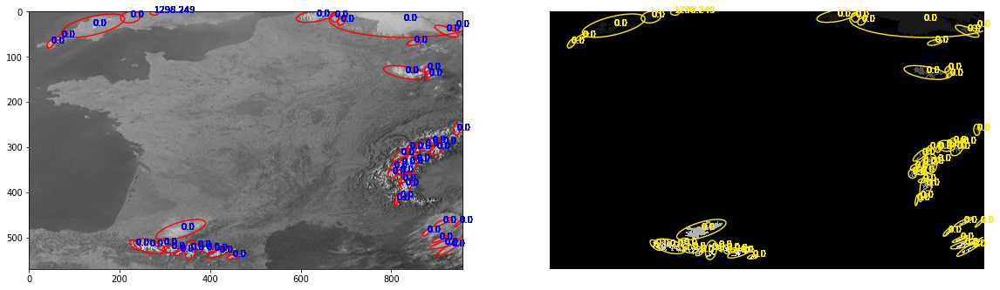

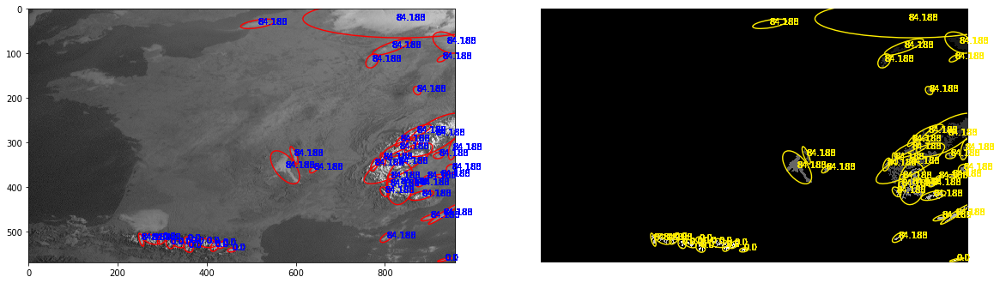

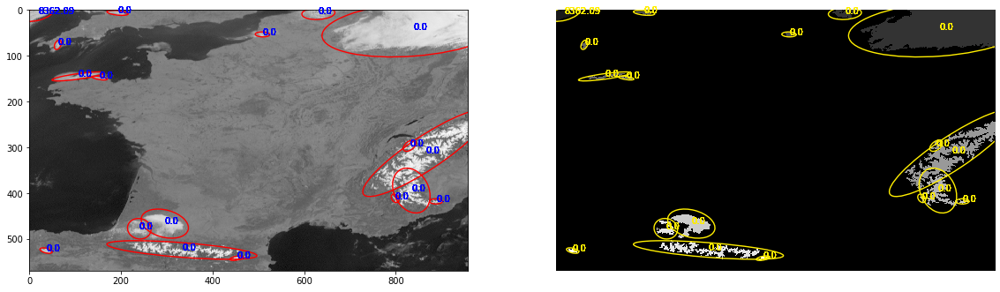

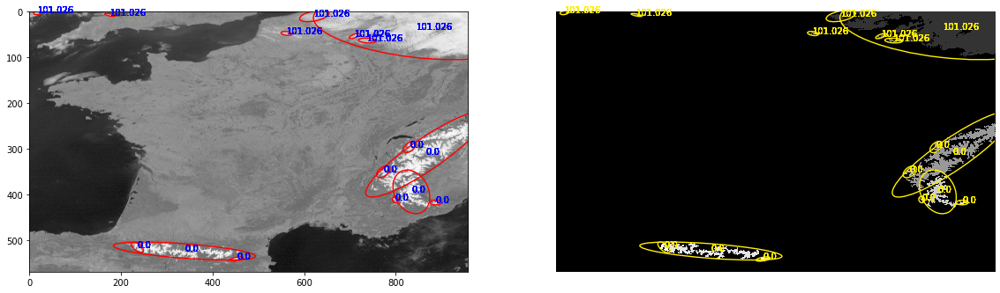

...

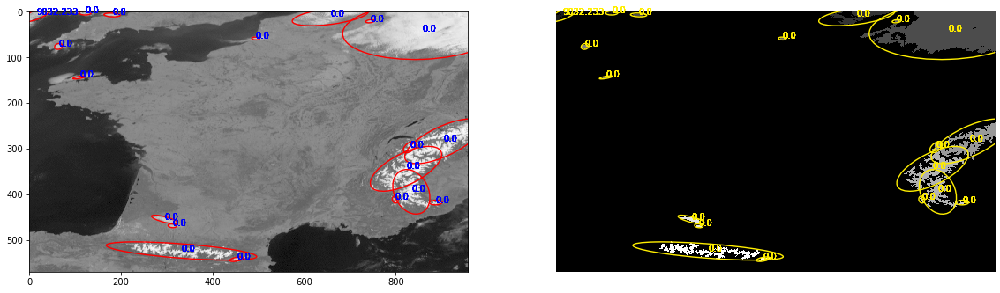

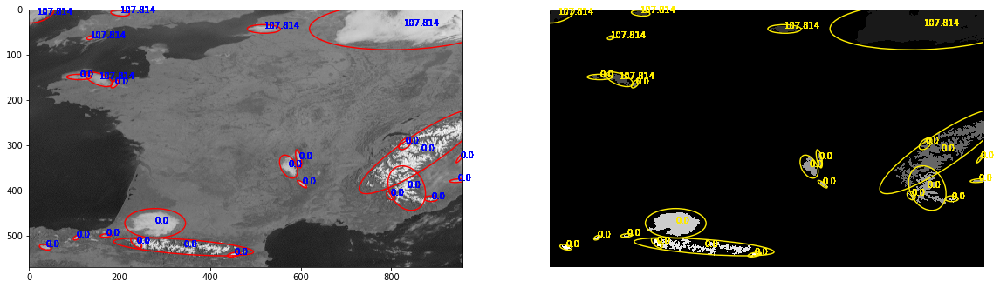

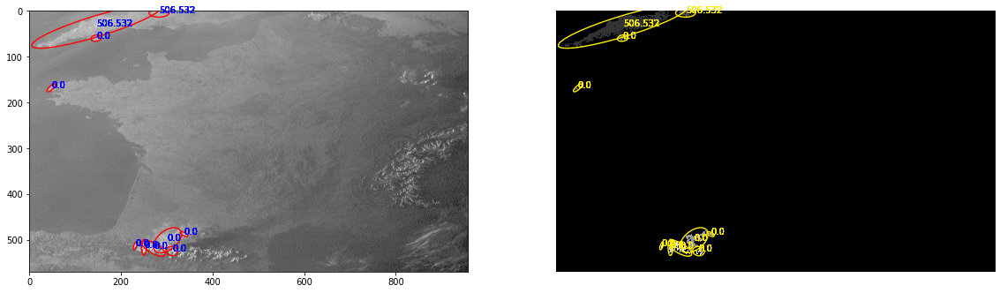

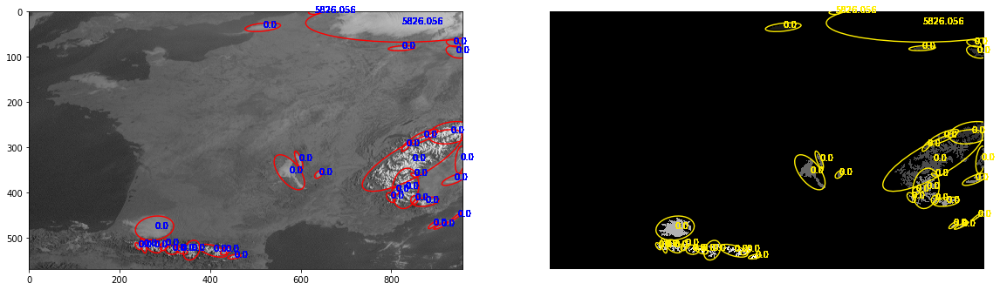

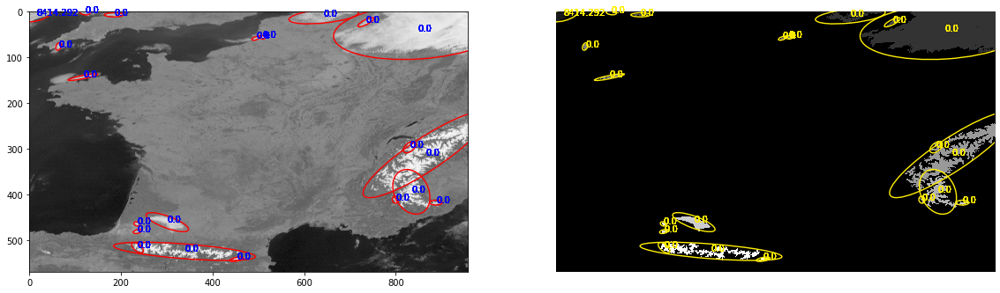

In [37]:
seg_Nuages(BD=Images, Min=80, Max=120)